## imports

In [1]:
import os
import re
import nltk
import html2text
import markdown
import numpy as np
import pandas as pd
#import brainiak.eventseg.event as event
import hypertools.tools.format_data as fit_transform
from num2words import num2words
from bs4 import BeautifulSoup
from helpers import download_file_from_google_drive as dl

import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
nltk.download('stopwords')
from nltk.corpus import stopwords as sw

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/jeremy/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### topic modeling parameters

In [5]:
n_topics = 100
video_wsize = 50 # sentences 

# vectorizer parameters
vectorizer_params = {
    'model' : 'CountVectorizer', 
    'params' : {
        'stop_words' : sw.words('english'),
        'max_df' : 0.5,
        'min_df' : 0.01
    }
}

# topic model parameters
semantic_params = {
    'model' : 'LatentDirichletAllocation', 
    'params' : {
        'n_components' : n_topics,
        'learning_method' : 'batch',
        'random_state' : 0,
    }
}

## functions

In [6]:
def wipe_formatting(script, rehtml=False):
    parser = html2text.HTML2Text()
    parser.wrap_links = True
    parser.skip_internal_links = True
    parser.inline_links = True
    parser.ignore_anchors = True
    parser.ignore_images = True
    parser.ignore_emphasis = True
    parser.ignore_links = True
    text = parser.handle(script)
    text = text.strip(' \t\n\r')
    if rehtml:
        text = text.replace('\n', '<br/>')
        text = text.replace('\\', '')
    md = markdown.markdown(text)
    soup=BeautifulSoup(md,'html5lib')
    soup=soup.get_text()
    soup = soup.replace('\n', ' ')
    return soup

In [7]:
def load_data(filepath, fileid):
    data_dir = os.path.dirname(filepath)
    
    if not os.path.exists(data_dir):
        os.makedirs(data_dir)
    
    if not os.path.exists(filepath):
        print('downloading data...')
        dl(fileid, filepath)
        
    print('loading data...')
    data = pd.read_csv(filepath)
    return data.dropna(subset=['script'])

In [8]:
def cleanup_text(transcript):
    lower_nopunc = re.sub("[^\w\s.]+", '', transcript.lower())    # remove all punctuation except periods (deliminers)
    no_digit = re.sub(r"(\d+)", lambda x: num2words(int(x.group(0))), lower_nopunc)    # convert digits to words
    spaced = ' '.join(no_digit.replace(',', ' ').split())    # deal with inconsistent whitespace
    return spaced

In [9]:
def get_windows(transcript, wsize=video_wsize):
    cleaned = cleanup_text(wipe_formatting(transcript))
    text_list = cleaned.split('.')
    video_w = []
    
    for ix, sentence in enumerate(text_list):
        video_w.append(' '.join(text_list[ix:ix+wsize]))
        
    return video_w

In [10]:
def topic_model(transcript, vec_params=vectorizer_params, sem_params=semantic_params, return_windows=False):
    windows = get_windows(transcript)
    # handle movies with missing or useless transcripts
    if len(windows) < 10:
        return np.nan
    
    traj = fit_transform(windows, vectorizer=vec_params, semantic=sem_params, corpus=windows)[0]
    
    if return_windows:
        return traj, windows
    else:
        return traj

In [11]:
def optimize_k(trajectory, ks_list):
    corrmat = np.corrcoef(trajectory)
    scores = []
    
    for k in ks_list:
        ev = event.EventSegment(k)
        ev.fit(trajectory)
        w = np.round(ev.segments_[0]).astype(int)
        mask = np.sum(list(map(lambda x: np.outer(x, x), w.T)), 0).astype(bool)
        within = corrmat[mask].mean()
        across = corrmat[~mask].mean()
        scores.append((within, across))
        
    t = list(map(lambda x: x[0]/(x[1]-(scores[0][0]/scores[0][1])), scores))
    t /= np.max(t)
    ratios = list(map(lambda x: x - k/(5*video_wsize), t))
    return ks_list[np.argmax(ratios)]

In [12]:
def segment_trajectory(traj, k):
    ev = event.EventSegment(k)
    ev.fit(traj)
    w = (np.round(ev.segments_[0])==1).astype(bool)
    segs = np.array([traj[wi, :].mean(0) for wi in w.T])
    event_times = []
    for s in ev.segments_[0].T:
        tp = np.where(np.round(s)==1)[0]
        event_times.append((tp[0], tp[-1]))
        
    return segs, event_times

In [13]:
def tm_handle_bad(transcript, **kwargs):
    try:
        return topic_model(transcript, **kwargs)
    # just catch all errors, nearly all data passes
    # often IndexError due to script being all newlines
    except:
        return np.nan

# main code

In [14]:
data_filepath = '../data/data.csv'
data_fileID = '1hCCn31z4HM4IzQi59DP-vvUpYKhlvo2S'
# possible numbers of events to try for each transcript
ks_list = list(range(2, 51))

# download and load data
data_df = load_data(data_filepath, fileid=data_fileID)

loading data...


In [15]:
for _, row in data_df.iterrows():
    print(data_df.loc[data_df.script == row.script].index[0])

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
2

In [16]:
for ix, row in data_df.iterrows():
    test = pd.read_csv('../data/data.csv', skiprows=range(1,row.id), nrows=1).T.squeeze()
    if pd.isnull(test.script):
        print(ix)

In [17]:

test = pd.read_csv('../data/data.csv', skiprows=range(1,1), nrows=1).T.squeeze()
test

id                                                         1
title                             10 Things I Hate About You
url        http://www.imsdb.com/scripts/10-Things-I-Hate-...
writers    Karen McCullah Lutz;Kirsten Smith;William Shak...
genres                                        Comedy;Romance
script     \n\n\n<b><!--\n</b>if (window!= top)\ntop.loca...
Name: 0, dtype: object

In [19]:
data_df.head()

,id,title,url,writers,genres,script
0,1,10 Things I Hate About You,http://www.imsdb.com/scripts/10-Things-I-Hate-...,Karen McCullah Lutz;Kirsten Smith;William Shak...,Comedy;Romance,\n\n\n<b><!--\n</b>if (window!= top)\ntop.loca...
1,2,12,http://www.imsdb.com/scripts/12.html,Lawrence Bridges,Comedy,\n\n \n 12 - Script\n
2,3,12 and Holding,http://www.imsdb.com/scripts/12-and-Holding.html,Anthony Cipriano,Drama,\n \n \n ...
3,4,12 Monkeys,http://www.imsdb.com/scripts/12-Monkeys.html,David Peoples;Janet Peoples,Drama;Sci-Fi;Thriller,\n\n\n<b><!--\n</b>if (window!= top)\ntop.loca...
4,5,12 Years a Slave,http://www.imsdb.com/scripts/12-Years-a-Slave....,John Ridley,Drama,\r\n\r\n\r\n 12 YE...


In [100]:
test = joblib.load('fit_cv.joblib')

In [20]:
import joblib


In [ ]:
Cou

In [21]:
s_lens = list()
for script in data_df.script:
    clean = cleanup_text(wipe_formatting(script))
    s_lens.append(len(clean))

In [134]:
s_lens.argsort()

array([349, 999, 673, ..., 419, 219, 569])

In [131]:
s_lens[s_lens.argsort()]

array([     0,      0,      0, ..., 272111, 272148, 295169])

In [204]:
i = 0
for x, sl in zip(data_df.reset_index().loc[s_lens.argsort()].script.values, s_lens[s_lens.argsort()]):
    print(f'<<<<<<<<<<<<<<<<<<<<<<<<\n{sl}\n')
    print(len(cleanup_text(wipe_formatting(x)).split('.')))
    print('-------------------')
    i += 1
    if i > 100:
        break

<<<<<<<<<<<<<<<<<<<<<<<<
0

1
-------------------
<<<<<<<<<<<<<<<<<<<<<<<<
0

1
-------------------
<<<<<<<<<<<<<<<<<<<<<<<<
0

1
-------------------
<<<<<<<<<<<<<<<<<<<<<<<<
0

1
-------------------
<<<<<<<<<<<<<<<<<<<<<<<<
0

1
-------------------
<<<<<<<<<<<<<<<<<<<<<<<<
0

1
-------------------
<<<<<<<<<<<<<<<<<<<<<<<<
5

1
-------------------
<<<<<<<<<<<<<<<<<<<<<<<<
7

1
-------------------
<<<<<<<<<<<<<<<<<<<<<<<<
7

2
-------------------
<<<<<<<<<<<<<<<<<<<<<<<<
7

1
-------------------
<<<<<<<<<<<<<<<<<<<<<<<<
8

1
-------------------
<<<<<<<<<<<<<<<<<<<<<<<<
9

1
-------------------
<<<<<<<<<<<<<<<<<<<<<<<<
9

1
-------------------
<<<<<<<<<<<<<<<<<<<<<<<<
13

1
-------------------
<<<<<<<<<<<<<<<<<<<<<<<<
13

1
-------------------
<<<<<<<<<<<<<<<<<<<<<<<<
14

1
-------------------
<<<<<<<<<<<<<<<<<<<<<<<<
14

1
-------------------
<<<<<<<<<<<<<<<<<<<<<<<<
15

1
-------------------
<<<<<<<<<<<<<<<<<<<<<<<<
15

1
-------------------
<<<<<<<<<<<<<<<<<<<<<<<<
16

1
-------------

In [174]:
xx = cleanup_text(wipe_formatting(x))

In [177]:
test.transform([xx])

<1x185776 sparse matrix of type '<class 'numpy.int64'>'
	with 1671 stored elements in Compressed Sparse Row format>

In [180]:
[xx]

['finding nemo transcript vone.zero copyright two thousand and three walt disney pictures pixar animation studios transcribed by bad_burn email markgonzalezone hundred and fifty-fourhotmail.com okay this is the workinprogress finding nemo film transcript. why is it workinprogress you might ask well for one this isnt a one hundred accurate transcript some words might be missing may not be right. second some lines may or may not have been spoken by the right character. there are instances in the film where a line is spoken but the character isnt on screen which makes things complicated. but id say this transcript is about nine thousand eight hundred and ninety-nine accurate. dialogue for each scene is seperated by a line of equal signs . this transcript is open for corrections additions if you have any. what you cant do however is to edit it and take credit for it. although i do not own the movie or its screenplay this transcript was made with no intention of copyright infringement and t

In [170]:
print(data_df.reset_index().loc[871].script)


        THE SAINT





BODY { background-color: "#FFFFFF"; font-family: Courier New, Helvetica, sans-serif; font-size:10.0pt }

DIV { position:absolute; left:5px; top:20px; width:734px; height:500px;  }

#loc { font-family:Courier New; font-weight: normal;margin-top:0in; margin-right:1.2in; margin-bottom:0in;
margin-left:0.8in;text-transform:uppercase } 

#slug {
	font-family:Courier New;
	font-weight: normal;
	margin-top:0in;
	margin-right:1.2in;
	margin-bottom:0in;
	margin-left:0.8in;
	text-transform:uppercase;
<b>	
</b><b>} 
</b>
#act { font-family:Courier New; font-weight: normal;margin-top:0in; margin-right:1.8in; margin-bottom:0in;
margin-left:0.8in } 


#speaker { font-family:Courier New; font-weight: normal;margin-top:0in; margin-right:1.in; margin-bottom:0in;
margin-left:2.8in;text-transform:uppercase }

#spkdir { font-family:Courier New; font-weight: normal;margin-top:0in; margin-right:2.7in; margin-bottom:0in;
margin-left:2.2in }

#dia { font-family:Courier New; font-weight

In [134]:
# fit topic model, transform script
data_df['trajectory'] = data_df.script.apply(tm_handle_bad)

In [136]:
data_df = data_df.dropna()

In [138]:
# determine number of events for segmentation
data_df['n_events'] = data_df.trajectory.apply(optimize_k, ks_list=ks_list)

2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50


/Users/paxtonfitzpatrick/anaconda/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


Text(0.5,0,'Number of events (k)')

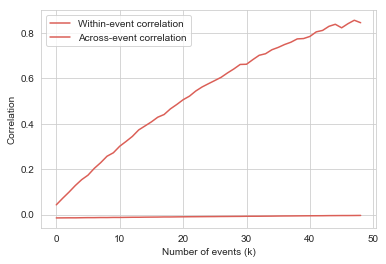

In [147]:
plt.plot(list(map(lambda x: x[0], scores)), label='Within-event correlation')
plt.plot(list(map(lambda x: x[1], scores)), label='Across-event correlation')
plt.legend()
plt.ylabel('Correlation')
plt.xlabel('Number of events (k)')

In [148]:
scores

[(0.04290213198056462, -0.014779459925506945),
 (0.07156369846011361, -0.014543652074382364),
 (0.09878287286760853, -0.014315412468220684),
 (0.1278909000458543, -0.014394613231778063),
 (0.15374288540736925, -0.013912086657378206),
 (0.17361056394330096, -0.013524163361846182),
 (0.20375463603681487, -0.013525271939540444),
 (0.22867925609587908, -0.013061558586150287),
 (0.25700205748342775, -0.013153382219467765),
 (0.2722901542403843, -0.012617027997388851),
 (0.30098079853068804, -0.012649644903612674),
 (0.32214312432565045, -0.012271264058134026),
 (0.3444050941195172, -0.011869281914679387),
 (0.37303100575908493, -0.0118422390771497),
 (0.3906457637307191, -0.011421398061939914),
 (0.4084323369354072, -0.01118518140591274),
 (0.42893837178808325, -0.010982739557794533),
 (0.440840392101024, -0.010504661178943346),
 (0.46574876685837796, -0.010506919592269617),
 (0.4849967643257479, -0.010157936000070707),
 (0.5059138483450132, -0.009861627916567193),
 (0.5217044918375758, -0.

In [149]:
t = list(map(lambda x: x[0]/(x[1]-(scores[0][0]/scores[0][1])), scores))
t /= np.max(t)
ratios = list(map(lambda x: x - k/(5*video_wsize), t))

Text(0.5,0,'Number of events (k)')

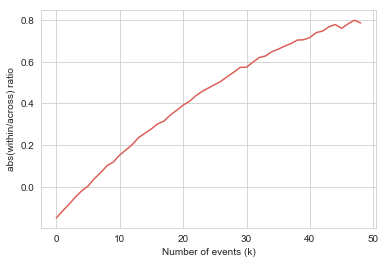

In [150]:
plt.plot(ratios, label='Within-event correlation')
plt.ylabel('abs(within/across) ratio')
plt.xlabel('Number of events (k)')

In [164]:
# segment trajectory based on that number
data_df[['segments', 'event onsets/offsets']] = data_df.apply(lambda x: 
                                                              segment_trajectory(x['trajectory'], x['n_events']), 
                                                              result_type='expand', axis=1)

/Users/paxtonfitzpatrick/anaconda/envs/py36/lib/python3.6/site-packages/pandas/core/frame.py:3140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]


In [166]:
data_df

,id,title,url,writers,genres,script,trajectory,n_events,segments,event onsets/offsets
0,1,10 Things I Hate About You,http://www.imsdb.com/scripts/10-Things-I-Hate-...,Karen McCullah Lutz;Kirsten Smith;William Shak...,Comedy;Romance,\n\n\n<b><!--\n</b>if (window!= top)\ntop.loca...,"[[2.631578947369967e-05, 2.631578947369967e-05...",49,"[[3.380959130076052e-05, 3.380959130076052e-05...","[(0, 35), (36, 72), (73, 103), (104, 130), (13..."
2,3,12 and Holding,http://www.imsdb.com/scripts/12-and-Holding.html,Anthony Cipriano,Drama,\n \n \n ...,"[[3.508771929831928e-05, 3.508771929831928e-05...",50,"[[3.7241607777685145e-05, 3.7241607777685145e-...","[(0, 51), (52, 98), (99, 129), (130, 158), (15..."


In [173]:
data_filepath = '../../data/data.csv'
data_fileID = '1hCCn31z4HM4IzQi59DP-vvUpYKhlvo2S'
# possible numbers of events to try for each transcript
ks_list = list(range(2, 51))

# download and load data
full_df = load_data(data_filepath, fileid=data_fileID)

loading data...


In [174]:
full_df

,id,title,url,writers,genres,script
0,1,10 Things I Hate About You,http://www.imsdb.com/scripts/10-Things-I-Hate-...,Karen McCullah Lutz;Kirsten Smith;William Shak...,Comedy;Romance,\n\n\n<b><!--\n</b>if (window!= top)\ntop.loca...
1,2,12,http://www.imsdb.com/scripts/12.html,Lawrence Bridges,Comedy,\n\n \n 12 - Script\n
2,3,12 and Holding,http://www.imsdb.com/scripts/12-and-Holding.html,Anthony Cipriano,Drama,\n \n \n ...
3,4,12 Monkeys,http://www.imsdb.com/scripts/12-Monkeys.html,David Peoples;Janet Peoples,Drama;Sci-Fi;Thriller,\n\n\n<b><!--\n</b>if (window!= top)\ntop.loca...
4,5,12 Years a Slave,http://www.imsdb.com/scripts/12-Years-a-Slave....,John Ridley,Drama,\r\n\r\n\r\n 12 YE...
5,6,127 Hours,http://www.imsdb.com/scripts/127-Hours.html,Simon Beaufoy;Danny Boyle,Adventure;Drama;Thriller,\r\n\r\n \r\n ...
6,7,1492: Conquest of Paradise,http://www.imsdb.com/scripts/1492-Conquest-of-...,Roslyne Bosch,Adventure;Drama,\n\n\n<b><!--\n</b>if (window!= top)\ntop.loca...
7,8,15 Minutes,http://www.imsdb.com/scripts/15-Minutes.html,John Hertzfield,Action;Crime;Thriller,\n\n\n<b><!--\n</b>if (window!= top)\ntop.loca...
8,9,17 Again,http://www.imsdb.com/scripts/17-Again.html,Jason Filardi,Comedy;Drama;Romance,\n \n \n ...
9,10,187,http://www.imsdb.com/scripts/187.html,Scott Yagemann,Drama,187\n by\n\n Sc...


In [159]:
for ix, i in enumerate(data_df.loc[data_df.script.str.contains('saint')].script):
    print(ix)
    print(cleanup_text(wipe_formatting(i)))
    print('------------')

0
twelve and holding written by anthony s cipriano four.six.four fade in ext. neighborhood street morning twin boys rudy and jacob carges twelve ride their bikes through a suburban neighborhood. rudy the more athletic of the two rides at a breakneck pace. jacob rides slowly due to a hockey mask that he wears over his face. its making it difficult for him to see. the boys turn down a dirt path and ride deep into some woods. int. woods continuous rudy and jacob ride to the edge of a clearing and stop. across from the clearing is a large oak tree which has a tree house perched high up in its branches. the boys cautiously look around and whisper. jacob you see em rudy no. but that doesnt mean theyre not here. after a beat rudy gets off his bike and starts walking towards the tree house. jacob stays behind eyeing their safety. rudy contd contd jacob come on. its cool. suddenly a rock comes careening from off screen. it hits jacob in the head and knocks him to the ground. rudy darts for the 

one thousand four hundred and ninety-two conquest of paradise one thousand four hundred and ninety-two conquest of paradise by roselyne bosch revised september twenty-three one thousand nine hundred and ninety-one fade in credits and music over int. audience room granada day we start on a mans elegant slipper. he is seated in a splendid chair. moving up the stocking leg we pass the garter of castile coming to rest on a pair of delicate hands. his fore finger impatiently plays with a large topaz ring. over this we hear distant footsteps echoing on marble floors. cut to a castilian face aquilaine profile olive complexion dark eyebrows and meticulously sculpted beard. this is treasurer sanchez. a door slams somewhere the footsteps getting closer. we can now here a subdued conversation. treasurer sanchez stands up as the door opens at the far end of the large gilded room. a women magnificent in somber taffeta enters. queen isabel of spain moves towards him. he bows slightly as she sits at 

------------
3
affliction screenplay by paul schrader based on a novel by russell banks one thousand nine hundred and ninety-seven shooting draft credits stilllife tableaus. lawford n.h. a town of fifty buildings on a glacial ridge neither mountain nor plateau. developed as one thousand eight hundred and eightys forestland discarded in the depression. winter has set in. halloween day. snowy fields yield to overcast skies oppressive horizonless flourescent. wickhams restaurant. where route twenty-nine bends. twenty-fourhour diner. margie fogg works here. trailer park in shadow of parker mountain. home of wade whitehouse. tobys inn. roadhouse three miles from town on the river side of route twenty-nine. everything not tied down ends up here. glen whitehouse farm. white clapboard. first congregational church. north on the common from city hall. lariviere co. ramshackle welldigging firm embarrassingly near the town center. wade works here. merritts shell station. cinder block. alma pittman

ali written by stephen j rivele christopher wilkinson eric roth michael mann story by gregory allen howard fade in ext. miami street movement night one thousand nine hundred and sixty-four in the dark. coming toward us. up and down in sync to an instrumental leadin from somewhere. a slip of light. a glimpse of somebody in shadow under a sweatshirt hood staring at us in and out of the dark as... int. the stage hampton house club empty frame night a man walks into the shot grabs a microphone slips out of his jacket and looks at us. he wants to tell us something. hes in a lavender light. this is sam cooke. what he calls out...a throaty mixture of gospel soul and sex...is let me hear it and women shriek. he says yeah they answer shrieking oh yeah... ext. miami street hooded mans face night up and down running along a dark road in the dead of night passing vacant lots with debris amid trees and faded buildings. he is cassius clay. he runs in construction boots. his eyes stare from under the

amadeus amadeus by peter shaffer final draft int. staircase outside old salieris salon night one thousand eight hundred and twenty-three total darkness. we hear an old mans voice distinct and in distress. it is old salieri. he uses a mixture of english and occasionally italian. old salieri mozart mozart mozart. forgive me forgive your assassin mozart a faint light illuminates the screen. flickeringly we see an eighteenth century balustrade and a flight of stone stairs. we are looking down into the wall of the staircase from the point of view of the landing. up the stair is coming a branched candlestick held by salieris valet. by his side is salieris cook bearing a large dish of sugared cakes and biscuits. both men are desperately worried the valet is thin and middle aged the cook plump and italian. it is very cold. they wear shawls over their nightdresses and clogs on their feet. they wheeze as they climb. the candles throw their shadows up onto the peeling walls of the house which is 

analyze that screenplay by peter steinfeld and harold ramis and peter tolan based on characters created by kenneth lonergan and peter tolan june two thousand and two draft for educational purposes only fade in int. dimlylit bar night two men caesar and marty ducks stand at the end of the deserted bar talking quietly oblivious to the exotic dancer grinding her pelvis on a pole in the middle of the small stage. body language and charisma tell us that caesar is the boss ducks his lieutenant. ducks its peezee. gotta be. he hates your fuckin guts. caesar brooding i dont know. ducks who else knew about the money and how did peezee know they popped tony cisco when we didnt even hear about it til last night caesar sighs heavily i dont know. ducks pressing what is so hard to understand here you said yourself peezee was a mamaluke and you couldnt trust him. now suddenly youre soft on the guy caesar i just dont think it was him. ducks okay ill bite. if not peezee then who caesar slowly rising to 

angels demons written by akiva goldsman april two thousand and eight int papal apartment day close on an ornate ring. its intricately carved with a seal an image of st. peter casting a net. the ring is carried on a satin pillow through a darkened regal apartment. in the distance bells are tolling the slow solemn tones that announce a death. a dozen men in scarlet cassocks roman catholic cardinals bend down to inspect the ring nodding in affirmation part of an ancient ritual. a younger man the camerlengo in a black cassock takes a silver knife and scratches the rings seal twice once horizontally and once vertically in the sign of the cross. now the ring is placed on a lead block. the camerlengo raises a silver mallet and smashes it down shattering the ring into a thousand tiny pieces. as the cardinals confirm to their satisfaction that the ring has been destroyed the hushed voice of a news reporter comes over the image. reporter the ring of the fisherman which bears the official papal s

arbitrage written by nicholas jarecki forty-one thousand seven hundred and eleven black. over credits we hear maria o.s. ...but you took a huge bet on the housing crisis in the middle of the biggest boom anybodyd ever seen. why robert o.s. im a child of the fiftys. my father welded steel for the navy. and my mother worked at the va. int. roberts mansion day as the conversation continues we see one. a maid clean an expansive living room waxing a mahogany table. two. a butler open sliding doors to an empty grand sitting room. three. an overhead shot as a servant carries packages up a long winding staircase. robert they lived through the depression pearl harbor and the bomb. and they didnt think bad things might happen they knew they would happen. maria is that whats happening now robert when i was a kid my favorite teacher was mr. james. mr. james said that world events always revolve around five things extending his fingers one byone int. roberts living room day and right on cue we see 

bachelor party screenplay by neal israel pat proft story by bob israel shooting draft one thousand nine hundred and eighty-four fade in ext. st. anns school day camera pans a group of freshlyscrubbed innocent children obediently standing in line like recruits for the holy crusade. pull back to reveal they are wearing the gray blazers striped ties and navy slacks of st. lukes school. they are waiting patiently at the curbside in front of the statue of the schools sainted namesake. one of the fifth grade boys pokes the kid next to him with his elbow. the other kid is about to retaliate when sister mary francis a stern faced nun appears behind them grabbing them both firmly by the shoulders. sister mary francis make one more move and youll both be staying late for the rest of the week. the boys softly in unison sorry sister mary francis. sister mary francis i didnt hear you. the boys louder sorry sister mary francis. sister mary francis checks her watch. she scowls and looks out past the 

bad teacher written by lee eisenberg gene stupnitsky june six two thousand and eight fade in ext. john adams middle school day to establish. a school marquee with removable plastic letters reads good luck with finals a janitor opens the glass and starts removing the letters. int. teachers lounge day pop a champagne cork hits the ceiling. teachers who rarely get to drink at work jockey for position holding out their plastic flutes. note female teachers outnumber male teachers one hundred and twenty-one. principal wally snur fortys balding faces the teachers. he has a habit of blinking hard before speaking. principal snur well its been another great year here at jams. who can forget mr. pinkus haunted classroom sandy thank you. sandy pinkus fortys sporting a ponytail smiles clearly enjoying the small compliment. sandy i aint afraid of no ghost. the other teachers laugh. principal snur or the wild success of... voice o.c. wally can i just say one quick thing wally turns to amy squirrel la

batman returns unproduced draft by sam hamm batman two screenplay by sam hamm first draft note the hard copy of this script contained scene numbers. they have been removed for this soft copy. note also the hard copy of this script was in the non preformat font bookman old. this has been changed to preformatted text for this soft copy. ext. gotham square dusk its finally happened. hells frozen over. christmas is two weeks off arid snow is falling in gotham. beneath its pristine white blanket the city looks uncharacteristically serene almost inviting. peace has been miraculously restored strangers wave hello. salvation army santas ring their bells on streetcorners. and now as night falls an illuminated sign winks on above broad avenue joyeux noel gotham only sixteen shopping days left till christmas. the streets are bustling with jolly shoppers. at a souvenir store we find an exasperated mom squabbling with her seven year old. like many other storefronts in gotham this one is overflowing

belle written by misan sagay an intricate piano piece george frederick handel... intercut white on black credits with below... one int. rustic studio of an artisan. day one one a series of shots. blue sky through shabby windows. run down walls. a paint splashed pine floor. tens of paint brushes soaking in stained jars. an artisans hands weatherworn swirling a paint brush in dirty water that sways at the bottom of one of the jars. a canvas the sketched face of a woman blonde blue eyed as the artisan strokes paint into her features a poster girl for eighteenth century portraiture. we will later recognise her as elizabeth murray caption england one thousand seven hundred and sixty-six two extint. docksslum room. england day. two two a swallow cuts across a red tinged sky. sound of footsteps trudging through mud. extreme close up a small figure being dressed by someone a shoulder an arm little hands. we do not see a face. close heavy naval boots move at sombre pace through slums. against a

y rev. forty-one thousand eight hundred and ninety cherry rev. forty-two thousand five hundred and ninety tan rev. forty-two thousand six hundred and ninety white rev. fifty thousand eight hundred and ninety pink rev. fifty-one thousand and ninety blue rev. fifty-one thousand eight hundred and ninety yellow rev. fifty-two thousand five hundred and ninety green rev. sixty-one thousand one hundred and ninety gold rev. sixty-one thousand two hundred and ninety buff rev. seventy thousand nine hundred and ninety salmon rev. seventy-one thousand two hundred and ninety cherry rev. seventy-one thousand nine hundred and ninety tan bonfire of the vanities screenplay by michael cristofer based on the book by tom wolfe third draft april two one thousand nine hundred and ninety warner bros. inc. one thousand nine hundred and ninety four thousand warner boulevard warner bros. inc. burbank california ninety-one thousand five hundred and twenty-two all rights reserved t rev. fifty-two thousand five hu

bringing out the dead early draft by paul schrader bringing out the dead first draft eleven thousand seven hundred and ninety-seven paul schrader from the novel by joseph connelly after world war one it was called shell shock. after world war two it was called battle fatigue. after vietnam it was called post traumatic stress disorder. frank pierce twenty-eight drives an ems vehicle for our lady of mercy hospital new york city. he has been a paramedic for five years. ext. new york streets night an ems bus careens around a corner tires squealing lights flashing siren whoopwhooping swooping through stygian canyons of new york. frank pierce twenty-eight drives. he wears dark cargo pants black boots a white shirt with the paramedic badge ems gold logo on one collar olm on the other. our lady of mercy paramedic is inscribed in white across the back of his navy jacket. on his belt twoway radio leather gloves beeper drug kit multi purpose tool kit miniflashlight collapsible baton. larry thirty

bruce almighty by steve koren mark okeefe rewrite by steve oedekerk seventy-three thousand and two shady acres entertainment int. kowolskis bakery kitchen day a news crew shuttles around a gigantic cookie. standing by are the kowolski brothers gustov and vol two short stocky men along with mother kowolski and other bakery family employees. a thirty year anniversary sign hangs in the background. bruce nolan looks into a makeup mirror desperately trying to place a large segment of wayward hair. bruce oh god no the hairs wrong. this is a bad sign. calling out we really need to get a makeup person the segment producer ally loman steps over. ally not in the budget. and not to worry youre going to look great in this. she holds out a hair net. bruce a hair net im not wearing a hair net. i just did the hair. ally matter of fact health code. in the kitchen or around the cookie you gotta have it. bruce to crew re hair net you guys should tell me this before hand this is like a huge waste of...mo

casino draft casino by nicholas pileggi ext. restaurant parking lot las vegas one thousand nine hundred and eighty-three day sam ace rothstein a tall lean immaculately dressed man approaches his car opens the door and gets inside to turn on the ignition. ace v.o. when you love someone youve gotta trust them. theres no other way. youve got to give them the key to everything thats yours. otherwise whats the point and for a while... i believed thats the kind of love i had. suddenly the car explodes. flames smoke and metal rise into the sky covering the view of the las vegas casinos and their signs. music in j.s. bach st matthew passion. aces body comes flying in extreme slow motion. his body twists and turns through the frame like a soul about to tumble into the flames of damnation. main title sequence. int. tangiers casino floor night vignette of ace through rippling flames we move in on ace rothstein overseeing the casino. he lights a cigarette. ace v.o. before i ever ran a casino or go

chaos written by tony giglio shooting script march fifteenth two thousand and four fade in begin opening credits aone ext. pearl street bridge night aone close on... a bronze plaque which reads pearl street bridge. on the bridge... rain pours down. an suv steers out of control and crashes into a stalled out vehicle. its quiet now except for the incessant pounding rain. in the distance police lights approach. smash cut to one ext. pearl street bridge night one through a television camera... the image is grainy and frenetic. a heavy rain pours down on a melee of activity. police cars block either end their lights ignite the sky in a dizzying red and blue design. the attention centers on... the suv and the crashed vehicle lay in the middle of the bridge. a man thirtys madness on his face his right hand holds a hostage a woman twentys racked with fear tight to his body. his left holds a gun two detectives slowly approach the man. only see the detectives from behind. a news reporter karen c

29
city of joy written by gerald brach roland joffe october one thousand nine hundred and ninety early draft for educational purposes only city of joy fade in title sequence. ext. bihar day dawn summer midone thousand nine hundred and eighty heat that has mass. that rises off the parched earth in shimmering waves. after a moment we see what appear to be figures coming out of the haze one by one. a family with their few belongings hasari pal thirty-three his wife aloka twenty-eight and their children daughter amrita thirteen sons manooj and shambu eleven and nine hasaris mother and father. they embark toward the night the rising sun behind them. ext. roadside bus stop day dawn hasaris father passes a gourd of precious water. hasari serves the children first. shambu gulps entirely too much the others forcing him to stop by a unified force of will. embarrassed he passes the cup to his brother who sips as does his sister. aloka barely wets her lips insisting on leaving the last drops for h

cold mountain by anthony minghella based on the novel cold mountain by charles frazier ext. cold mountain town north carolina. day on a black screen credits. a raucous voice swimmers chanting in the cherokee language. a range of mountains slowly emerges shrouded in a blue mist like a chinese water color. below them close to a small town young men armed with vicious sticks and stripped to the waist come charging in a muscular steaming pack. their opponents also swinging sticks attach the pack. a ball barely round made of leather emerges smacked forwards by inman who hurtles after it and collides with a stick swung by swimmer a young and lithe american indian. inman falls clutching his nose. the ball bobbles on the ground in front of him. he grabs it and gets to his feet the blood pouring from his nose. his team form a phalanx around him and he continues to charge. a pristine cabriolet pulled by an impressive horse comes down towards the town. it has to pass across the temporary field of

the crow city of angels written by david s goyer james obarr fade in ext. limbo daynight a heavy mist hangs before us endless and impenetrable. and out of that primordial fog a crow materializes flying toward the camera in slow motion. sarah o.s. i believe theres a place where the restless souls wander. burdened by the weight of their own sadness they cannot enter heaven... presently a second shape materializes a figure on horseback. a warrior whose baleful eyes shine behind the familiar irony mask war paint. sarah o.s. and so they wait trapped between our world and the next endlessly searching for a way to rid themselves of their pain in the hopes that somehow some day... the figure on horseback sweeps past us disappearing once again into the mists of time. sarah v.o. ... they will be reunited with the ones they love. dissolve to ext. docs commercial waterfront night present day. the crow settles on a shipping container tilts its head watching... super title city of angels october twe

detroit rock city written by carl v dupre fade in int. mrs. bruces living room night decorated in carol brady chic. when its not gaudy tacky and loud its blander than toast. colors like lime green and sunshine orange should be reserved for popsicles only. mrs. bruce late thirtys enters looking exhausted. she carries a glass of wine in one hand and a book in the other erma bombecks the grass is always greener over the septic tank. humming weve only just begun mrs. bruce crouches next to her wildlyancient entertainment center complete with eighttrack. she flips the first record forward on her ronco record mate. album after album flaps forward. olivia newtonjohn neil diamond the osmond brothers. she stops on the carpenters and sighs at the serene cover art. just what the doctor ordered. placing the vinyl on the turntable she clicks the dustcover closed and flicks play. reclining in her lazyboy she sips her wine opens the book and awaits the mellow tones of karen carpenter. suddenly her ea

------------
37
family man chapter one early history one int. kennedy airport pan am terminal night super autumn one thousand nine hundred and eighty-seven a line of passengers about to board a pan am flight to london. jack campbell twenty-two head full of long unkempt hair tom selleck mustache the hopeful look of youth in his eyes... sitting next to... kate reynolds twenty-one pretty dorothy hamill haircut... rubbing the tears from her swollen red eyes... kate i got you a few necessities... kate hands jack a new copy of vonneguts cats cradle. kate contd your copy was a mess... jack accepts the book but hes unable to take his eyes off kate. she hands him a cassette. kate contd every one of these songs will remind you of me in a slightly different way... jack all in one tape kate i also put side two of london calling on there... kate leans over and kisses him passionately on the lips. kate contd that was not officially the goodbye kiss. it was just an interim kiss... he looks at her his

g.i. jane by david twohy first draft august six one thousand nine hundred and ninety-five fade in int. senate hearing room capitol bldg. day blinding in their white uniforms naval flag officers sit in the audience showing their support for theodore hayes a fiftyyearold civilian. this is his confirmation hearing. reading from prepared material hayes ... last few years have brought many advances in the interests of women in naval service particularly in the landbased maritime specialties. whats more the navy has instituted special sensitivity courses with an eye on dehaven whoa whoa whoa. landbased maritime specialties. gimme a second here to deeuphemize that... at the center of a dais lillian dehaven leans back to ponder the ceiling of the hearing room. her plaque card reads chairperson senate arms committee. dehaven is a toughhided old southern belle scarlett ohara at sixty. in her arsenal she carries conversational handgrenades and shes apt to pull a pin at the slightest whim. dehaven

gothika by sebastian gutierrez revised second draft december eight two thousand and two the woodward forensic institute wfi is a one hundred and seventy-fivebed intermediate security treatment facility for male and female psychiatric patients. its primary clientele are those who have histories of committing criminal offenses and are either committed to the department of mental health by the circuit courts of the state or who are admitted under authority of an appointed guardian. fade in opening credits over quick cuts int. miranda and dougs bedroom dawn push in on a sleeping couple in the dark. the alarm clock reads five hundred and fifty-nine am. the womans eyes open a second before the alarm beeps and turns it off. she grabs a glass of water on her bedside table and drinks it. climbs out of bed past typical bedside photographs wedding vacation etc.. this is miranda grey thirty sharp and prettier than she knows. int. gym swimming pool morning miranda slides through the water. swimming

hannah and her sisters hannah and her sisters by woody allen as the last credit appears the song ends in a crescendo and the screen fades to total black. immediately a new melody begins an uptempo jazz number as a title appears on the screen. god shes beautiful... cut to int. hannahs apartment night a full face of lee wearing a gray sweater and leaning against the dining room doorway. she gazes into the camera with a halfsmile on her face as elliot speaks over the screen. elliot v.o. god shes beautiful. lee glances over her shoulder then turns from the doorway and walks away. the camera follows her moving across a bookandphotographfilled bookshelf that obscures her from view as she walks into a crowded comfortable vestibule. people some holding drinks some just entering the apartment surround her. everyone is talking at once carrying on easy familiar conversation. elliot v.o. shes got the prettiest eyes and she looks so sexy in that sweater. lee smiles at the various people exchanging 

heavenly creatures screenplay by frances walsh and peter jackson illustrated by paul hamlyn prologue newsreel footage of christchurch circa one thousand nine hundred and fifty-four. ext. victoria parkbushy track late afternoon camera crashes out of bush and races up a dark bushy track. close on . . . two pairs of feet running up the track slipping in the mud . . . desperate. wide shot . . . reveals two girls running up the track distraught. juliet hulme nearly sixteen tall blond and willowy and pauline rieper sixteen darkhaired shorter and stockier than juliet. it is one thousand nine hundred and fifty-four. both girls are dressed in overcoats on a chilly winter day. they slip and stumble on the dirt track that winds up the steep victoria park hillside. thick vegetation and overhanging trees give the path a tunnel like feeling. cut to ext. oceanliners deck dayblack white . . . pauline and juliet running . . . this time they are happy in holiday clothing weaving around other passengers 

hellraiser by clive barker july twenty-eight one thousand nine hundred and eighty-six draft hellraiser a screenplay by clive barker paragan film productions ltd c clive barker twenty-eight.seven.eighty-six one hundred and fifteen flood street london. swthree thirteen million five hundred and twenty-four thousand one hundred and ninety-five one title sequence in darkness a bloodcurdling cacophony the squeal of unoiled winches the rasp of hooks and razors being sharpened and worse the howl of tormented souls. above this din one particular victim yells for mercy a mixture of tears and roars of rage. by degrees his incoherent pleas are drowned out by the surrounding tumult until without warning his voice pierces the confusion afresh this time reduced to naked scream. and with the sound an image. a house number fifty-five lodovico street an old three storey late victorian house with gaunt trees lining its overgrown garden. its curtains are drawn there is newspaper over its top window. the t

the imaginarium of doctor parnassus written by terry mckeown charles gilliam may twenty-sixth two thousand and seven london two thousand and seven.. now one ext night urban terrace one a row of rundown terrace houses. some are boarded up. not all the street lights work. those that do cast shadows of parked vehicles glistening in the rain. a front door opens and don appears with rubbish which he puts in a bin. he hears something and looks up to see four big horses pulling a hulking great wagon down the middle of the street. the wagon is a gigantic windowless box. the horses are harnessed and there are reins but no sign of a driver. its a very weird sight. don unable to take his eyes off this amazing apparition shouts back into the house from where light from a tv flickers. don carol... carol carol v.o. what don come here quick carol v.o. what is it don quick carol v.o. irritated im trying to watch this its the last episode don annoyed come here carol appears in the doorway. carol what i

invictus aka the human factor written by anthony peckham based on material by john carlin second draft fifty-two thousand two hundred and seven sport has the power to change the world. it has the power to inspire the power to unite people that little else has ... it is more powerful than governments in breaking down racial barriers. nelson mandela ext. allwhite high school western cape day a big rich powerhouse allwhite high school located near the freeway into cape town. the rugby fields are immaculate. fifteen year old boys in striped rugby jerseys train with total intensity under the critical eye of the coach. right across the boundary fence from the rugby fields is an area of waste land leading up to the freeway. there black and colored mixedrace boys of the same age play a loose game of soccer with a tennis ball. most of them have bare feet and threadbare dirty clothes most of them are noticeably smaller and skinnier than the white boys. two cultures separated by more than the hig

jennifer eight written by bruce robinson june one thousand nine hundred and ninety-one one int. community hall. day. the church of st. peter los angeles. whoever you see here whatever you hear here stays here. thats a notice on a wall. heres another notice no smoking. everyone is smok ing. this is an aa meeting. theres a lot of faces to look at. i dont know when well get to the one thats talking but when we do its like this. eyes like glue. fifty years old with a face the color of a snuffusers hanky. he says this benny .. after my third recovery my wife made me swear id never bring another bottle into the house. and i never did. i bur ied it under the lawn. cut out a turf stood it upright with a piece of tin foil instead of a cork. so here we are out in the yard and shes happy because im getting healthy in a pair of swim ing shorts no way near no booze. she decides to prune the roses. meanwhile im laying there with a straw stuck in to the fucken lawn doing a quart of red .. curious thi

the kings speech written by david seidler open on one int. bathroom york house london day midone thousand nine hundred and thirtys one a shimmering surface of cold water held in an immense free standing white enamelled bathtub with gilded lions legs bulges in slow motion to the chords of handels trumpet volunteer. a head emerges. white gloved hands in livery rush to envelope the surfacing naked wet body in white towels. two int. dressing chamber york house day two the ritual continues with crisp military precision. close on the royal coat of arms stamped in gold lion and unicorn embrace a shield divided into four quarters with harp thistle and more lions denoting england ireland scotland and wales. the shield is surmounted by a crown. this emblem is on a cufflink fastened on a starched white shirt. trousers pressed to a knife edge are held for stockinged feet and gartered legs to be inserted. mirror polished boots are laced tight. jacket held ready. arms shoulders chest received. glist

the ladykillers screenplay by joel coen and ethan coen based on the one thousand nine hundred and fifty-five movie the ladykillers by william rose ext. mississippi river day a boat specifically a garbage scow. we see it from on high chugging down the placid but mighty mississippi. head credits play over coverage of the garbage scow. no sound except for an incongruously heroic score. the coverage is a little rough coarsegrained along with the overbearing score it almost suggests an industrial film rather than a feature. one piece of sound the toot of the boats horn is obviously library. and not a new library either. the garbage scow passes under a bridge spanning the broad sluggish waters and proceeds on to its landfill a steaming river island. disturbed gulls and other scavenger birds rise from where they were picking through trash. their squawks like the boat horn are not quite believable as sync. the head credits end as the anthemic music resolves. ext. saucier mississippi day an old

les miserables written by william nicholson alain boublil claude michel schönberg and herbert kretzmer adapted from the stage musical les misérables based on the novel by victor hugo may twenty two thousand and twelve black screen superimpose caption the year is one thousand eight hundred and fifteen. the french revolution is a distant memory. napoleon has been defeated. france is ruled by a king again. aone ext. toulon port day aone rise up out of the irongrey surface of the ocean seething in the wind towards the shore. winter rain slices the air. ahead the port of toulon home of the french navy. a forest of tall masted warships. the great ships heave at anchor the wind whipping their rigging. through the sea spray we see the great ribs of warships under construction and warships being refitted. superimpose caption toulon home port of the french navy one ext. toulon dock day one stormlashed sea and driving rain. a great wave rises up and hammers down. as it recedes we see the figures 

the life of david gale by charles randolph first draft march one one thousand nine hundred and ninety-eight fade in ext. twolane highway sunrise a dishevelled woman in a business suit twenty-seven runs down a lonely highway in texas hill country moving desperately through the thick morning fog. shes carrying a vhs cassette. the sounds of her breathing and shoes hitting the pavement echo into the mist. she runs and runs. she slows outofstrength looks up and down the highway. both in front and behind it leads straight into the mist a tunnel of fog. she stumbles on a final effort. she runs. sees something. stops cold. dissolve to white dissolve to int. office of deathwatch austin sunrise a clock on the wall six hundred and eleven. beneath the clock a simple banner reads deathwatch austin. young man o.s. its probably been about seven minutes... the office is small cheaply furnished. one wall is filled with neat rows of eightxtens of death row inmates. about thirty percent have red crosses 

64
the long kiss goodnight by shane black revised draft february twenty-four one thousand nine hundred and ninety-five a windowpane assaulted from without by snowflakes. wind tossed. inside a bed dappled with moon shadow. a little girl fast asleep. the wind whistles and sighs outside. she dreams... eyelids closed eyes roving beneath... then suddenly they snap open. a stifled cry. she thrashes for her stuffed bear as a soft voice says voice shhhhh. and theres mom kneeling beside her. vague shape in the dimness. the full moon throws light across one sparkling eye. little girl mommy the men on the mountain... mom shhhh. gone all gone now. strokes her hair im here. mommys always here and no one can ever hurt you. safe now... safe and warm... snug as a bug in a rug. beat ill sit with you think you can sleep little girl turn on the nightlight. the mother nods. passes her left hand gently over the girls forehead. mom close your eyes now. i love you. the child subsides breathing steady. eyes c

machete written by robert rodriguez ext. mexican city day aerial over the city flying down into a federale car tearing through the slums. piles of garbage scatter stray dogs scramble. int. federale car moving day machete mexican federale officer cruz drives with rookie officer erhman riding shotgun. a rosary swings back and forth on the rearview mirror. chief torrezs yells crackle through the police radio. torrez on radio officer cruz stand down do not attempt to take the safehouse alone officer cruz you hear me officer erhman torrez sounds mad. you going to answer him machete glares. erhman nervously picks up the radio. officer erhman contd on route to target no need for assistance. torrez on radio machete you son of a bitch i told you to wait set up a perimeter and wait for further orders. you hear me pendejo machete slowly takes the radio from erhman. he hangs up. ext. mexican hotel day fleapit motel sits derelict at end of the street. dead cars on the lawn chickens scratching in th

man on fire by brian helgeland based on the novel by a.j. quinnell february ten two thousand and three v two.zero property of new regency productions inc. work in progress twenty-one thousand and three one. man on fire opening title sequence ext. mexico city day high over the city on a bright sunday morning the sun pounding its way through the orange haze of smog. as we descend toward the clots of traffic blocking the streets the sounds of a mass being sung. a catholic church the big wooden doors open to release the parishioners inside. feature a tall lanky eighteenyear old. holding his girlfriends hand anxious for sunday to really begin. they dont notice the traffic suddenly thin like a faucets been cranked down. they move toward a mercedes five hundred. as a chauffeur holds the back door open for them... a grand marquis squeals around the corner lurches to a stop alongside the mercedes. four men get out flashing badges. in a moment theyre hustling eighteen toward the car stiff arming

mean streets written by martin scorsese mardik martin ethan edwards ah get born keep warm short pants romance learn to dance get dressed get blessed try to be a success please her please him buy gifts dont steal dont lift twenty years of schoolin and they put you on the day shift bob dylan subterranean homesick blues supered over bottom of screen like a tv news bulletin the film is in color unless otherwise noted. a darkened diffused image of a man lying on the ground. a tree is above him. the image is more diffused on the edges. it is black and white and appears to be coming from a television. the body of the man is practically totally in shadow. announcers voice ladies and gentlemen on the new tonight the first actual motion pictures of death. a small orange fire appears in the breast of the man. announcers voice watch closely at the moment of death. the small orange fire fades away. color charles cappa jr. charlie is twenty-five of sicilain origin. he was educated in roman catholic 

millers crossing by joel and ethan coen millers crossing an original screenplay by joel coen and ethan coen one. fade in close shot a whiskey tumbler that sits on an oak side bar under a glowing green bankers lamp as two ice cubes are dropped in. from elsewhere in the room man off im talkin about friendship. im talkin about character. im talkin about hell leo i aint embarassed to use the wordim talkin about ethics. whiskey is poured into the tumbler filling it almost to the rim as the offscreen man continues. . . . you know im a sporting man. i like to make the occasional bet. but i aint that sporting. the speaker a balding middleaged man with a round open face. he still wears his overcoat and sits in a leather chair in the dark room illuminated by the offscreen glow of a desk lamp. this is johnny caspar. behind him stands another man harder looking wearing an overcoat and hat and holding another hatpresumably caspars. this is bluepoiont vance. caspar contd when i fix a fight sayif i p

moneyball written by steven zaillian aaron sorkin in black there will always be people who are ahead of the curve and people who are behind the curve. but knowledge moves the curve. bill james one int. oakland coliseum night one static shots a deserted locker room. empty showers. cinderblock tunnels lit with wireencased lamps like in a coal mine. three security guards watch a game on a tv. legend october fifteen two thousand and one we begin to hear disembodied cheering crowds and the faint voice of an announcer brennaman vo ... nobody on two and two to saenz who has just three at bats in the series and none of them hits as he settles back in two ext. oakland coliseum night two at the end of a tunnel the as empty dugout. the empty diamond. just a couple of the floodlights are on. brennaman vo rivera looks in for the sign he has it the pitch saenz swings and the announcers voice and excited crowd abruptly cut off. in silence we regard the sixty thousand empty seats that wrap around the 

m y b e s t f r i e n d s w e d d i n g by ronald bass first draft screenplay int. bouley restaurant new york night dim lighting crowd buzz a long line of the rich the celebrated the congenitally impatient. everyone in this queue holds a reservation at least an hour overdue. tourists cant even make the line. pan ahead to... ... the burnished dining room the tables of power the elegant service. covertly many eyes are drawn to the one table receiving by far the most lavish service of all. captains hover presenting delicacies pouring wines murmuring obsequiously to a guest whose person they screen from our view. we can see however... ... the honored guests companion. ignored bemused across the table. this is digger downes thirty-six darkly attractive. kind eyes an intellectuals mouth saville rows most unobtrusive and conservative chalkstripe suit. he is gay but you wouldnt guess it. loyal and wise and generous and you might. he watches with a quiet twinkle as the captains now step back re

------------
80
the passion of joan of arc written by carl theodor dreyer joseph delteil translated by oliver stallybrass at the bibliothèque nationale in paris it is possible to see one of the most famous documents in the history of the world the official record of the trial of joan of arc. the bibliothèque nationales original record of the trial of joan of arc is shown on the screen. an invisible hand turns over the manuscript pages. ... if you turn over the pages yellow with age which contain the account of her martyrdom ... page after page is shown of this unique document with its lines as straight as arrows its marginal annotations and the naïve miniature drawings for which the notaries have found time and space. ... you will find joan herself ... not the military genius who inflicted on the enemy defeat after defeat but a simple and natural young girl ... who died for her country. the last pages are turned. then the picture disappears and gives way to the first scene of the film 

the power of one written by robert mark kamen based on the novel by bryce courtenay february one thousand nine hundred and ninety draft for educational purposes only copyright one thousand nine hundred and ninety warner bros. two. the power of one what if the power of one becomes the power of many and the power of many becomes the power of one fade in one ext. south african farm day one thousand nine hundred and thirty-nine one a white car sits in the yard of the farmhouse. on the door a decal capetown sanitorium. two men dressed in the white uniforms of the sanitorium exit the farm house one gently guiding a rather frail troubled woman toward the car the other totes her suitcase. the v.o. of a young man narrates young man v.o. there comes a time in everyones life when they discover that the only person you can truly depend on is yourself. that the only real power anyone has to get anything done is the power of one. with any luck you can make it through a lot of years before you ever h

the private life of sherlock holmes by billy wilder and i.a.l diamond the private life of sherlock holmes fade in brass plaque day engraved on it are the words cox co. bankers. reflected in its shiny surface are double decker red buses and other presentday london traffic. int. bank vault day an iron gate opens and two bank guards come in. one of them switches on the lights. on the shelves which line the walls are dusty strongboxes document cases wrapped packages etc. the guards move along the shelves searching for something. watsons voice somewhere in the vaults of a bank in london is a tin dispatch box with my name on it. it is not to be opened until fifty years after my death. the guards find a battered tin dispatch box with the name john h. watson m.d. painted on it. they remove it from the shelf set it down on a table. the box is tied with heavy cord the knots sealed with wax. strung on the cord is the key. watsons voice it contains certain mementos of my long association with a ma

rachel getting married written by jenny lumet one ext. halfway house porch. day one kym a darkly beautiful girl in her early twentys is smoking furiously on the porch of an urban halfway house. she glances impatiently at her watch and presses her ear to her cell phone. as she exhales we hear the rumble of thunder. irritated she crams her cell phone into her bag. rosa a halfway house staff nurse is patiently handling walter an irate patient who is screeching... walter i want my fucking zippo now walter starts yanking at his hair. rosa walter that is a behavior... walter raking his nails against his forearm fuck you rosa and you are making a choice. her cell phone rings... rosa to walter hold on...hello walter god kym dont you get it yet waldo shes making a choice not to give you your lighter because youll torch the selfhelp library again. walter im walter. kill anybody recently run anybody over with a fucking car kym grinds her cigarette under her heel and blows smoke but gives no signa

rocknrolla written by guy ritchie june nineteen two thousand and seven white revision six thousand six hundred and seven one. one int. derelict building day one we meet mumbleslate thirtys and one two late thirtys. they are listening to a sales pitch from two real estate agents. we see all the relevant pictures of their pitch explaining a changing city london. slick estate agent v.o. two years ago this property cost one million pounds. we see building today it costs five million. the camera whip pans over to another part of the building to see the other estate agent giving his pitch. the camera will keep this back and forth for the duration of the scene. other slick estate agent v.o. how did this happen cut to relevant pictures as he speaks attractive tax opportunities for foreign investment restrictive building consent and massive hedge fund bonuses... beat london my good man is fast becoming the financial and cultural capital of the world. slick estate agent and of course the russian

saving mr. banks written by kelly marcel sue smith ext. maryborough park australia day one thousand nine hundred and six over black music string violins treat us to a familiar song opening and then a voice male. travers v.o. singing winds in the east mist coming in fade in a whoosh of wind spins us around in a blue sky spinning spinning until we slow to a stop and find ourselves amongst white fluffy clouds. a shadow oddly shaped like an umbrella dances amongst the nimbus. travers v.o. like something is brewing about to begin the shadows direction becomes purposeful taking us down through the clouds whipping us on the wind towards a small town in the distance. travers v.o. cant put me finger on what lies in store downwards and downwards until it skittishly circles a large bustling park and then swoops us into the lavish gardens. there a tenyearold girl plays in the lush grass she puts the finishing touches to a miniature version of the large park she sits in benches made from twigs tree

seven unproduced draft by andrew kevin walker seven by andrew kevin walker january two hundred and seventy-one thousand nine hundred and ninety-two the world is a fine place and worth fighting for. ernest hemingway for whom the bell tolls one thousand nine hundred and forty ext. country church day the white cross on the church steeple stands against blue sky. the church bell rings resonating. mass has let out. small church small congregation. the dirt road in front is lined with pickup trucks and parishioners on foot heading to outlying farms and homes. an old twostory house sits across the road. lone. int. old house day sunlight comes through the soot on the windows more brown than bright. somerset forty-five in a suit and tie stands in this empty secondstory room. he looks around at the ceiling at the worn wooden floor at the peeling wallpaper on the walls. somerset walks to one wall where the current wallpaper is peeled away to reveal flowery wallpaper underneath. he runs his finger

the sessions formerly the surrogate written by ben lewin based on a true story ext. berkeley california. day one one subtitle berkeley california one thousand nine hundred and eighty-one dissolve to actual tv news footage from one thousand nine hundred and eighty-one a busy intersection near the uc berkeley campus. a strange selfpropelled motorized gurney whirrs into view and makes its way over a pedestrian crosswalk. the passenger mark obrien in his early thirtys is visible only from the neck up. the rest of him is covered by a blanket. he operates the gurney with a mouth control and a set of mirrors positioned around his head. news reporter v.o. mark obrien has been going to uc berkeley since one thousand nine hundred and seventy-eight. thats obrien in the motorized gurney heading for class last week. the gurney continues along a leafy promenade on the campus. passersby just go about their normal business. news reporter v.o. he had polio when he was six years old. the disease left hi

the shipping news ron bass third draft rewrite february twenty-three one thousand nine hundred and ninety-nine previous drafts by laura jones beth henley int. laundromat mockingburg new york night glaring fluorescence trash overflowing with cheap detergent boxes empty coke machine flashing all lights orange. only two dryers are humming. its very late. keep panning to... ...a wiry gimleteyed woman furtively removing crumpled newspapers from a dryer. she flattens and folds them meticulously her glance darting angrily everywhere. top secret mission. ...a natty little black man. partridge has spread a late supper on a neat cloth atop a dryer. small cold fowl. brie baguette olives. bottle of red. an air of competence of indomitable upbeatness. he ignores the spydressedasbag lady as if she were normal. more curious about... ...a hulking rumpled figure scrutinizing help wanted ads as if cramming for lifes midterm exam. thoughtful. circles one slowly. set out on quoyles dryer are one snickers 

smashed written by james ponsoldt susan burke september twenty-fourth two thousand and eleven over black clinking glasses and other assorted bar sounds. karaoke announcer v.o. lets give a hand to rodney scattered applause and laughter. karaoke announcer v.o. next up weve got a little lady named...kate joyful applause. bar voices v.o. yeah kate the opening muzak strains of a karaoke song to be determined fade in one int. karaoke bar night one close on kate hannah latetwentys pretty and wholesome and oh yeah piss drunk. she stands on a tiny karaoke stage in the far corner of a halfempty dive bar. kate holds a microphone and dances as she sings a bad karaoke version of song to be determined. what kate lacks in talent she more than makes up for with charm and enthusiasm. at a table near the stage is charlie hannah kates husband latetwentys scruffy but handsome also pretty damn drunk. he enthusiastically claps and points to kate making up a cheering section along with owen hannah charlies y

taking sides by ronald harwood adapted from the play by ronald harwood final draft one thousand nine hundred and eighty-eight fade in int. berlin concert hall one thousand nine hundred and forty-four night a man conducting beethoven. air raid in progress. bombs falling nearby. the orchestra continues to play. suddenly the lights go out. the music stops. int. backstage corridor concert hall night a beam from a torch bouncing making shadows. an attendant carrying the torch hurries down the corridor. the air raid continues. he comes to a door knocks opens it and looks in. attendant agitated dr. furtwängler the reichsminister. the sound of heavy footsteps approaching. the attendant turns his torch to light the way for three men in nazi uniform also with attendants and torches marching down the corridor. the attendant bows deeply as the reichsminister and his aide go through the door. the other man remains in the corridor on guard. int. conductors room night candles light the room where the

the ugly truth screenplayrevisions by nicole eastman tracey jackson peter hume david diamond david weissman roger kumble current revisions by karen mccullah lutz kirsten smith february fourteen two thousand and eight one int. kphx tv lobby day one abby richter thirtys pretty driven and absolutely in control walks through the lobby greeting the security guard. abby morning freddy. security guard morning abby. another peaceful day abby if you say so... two int. kphx corridor morning moments later two joy fortys the associate producer falls in step with abby. joy panicked weve got problems. abby there are no problems joy. only solutions. joy the skycam on the traffic copter has a cracked lens and they cant fix it. abby okay thats a problem. thinking then... call matt hardwick down at media services. hes got a few sky cams and he owes me. now where are my weathermen joy opens a door to a waiting area. three int. kphx waiting area morning continuous three several portly latino men look up a

you can count on me screenplay by kenneth lonergan shooting draft two thousand fade in int.ext. a car moving. night the shifting lights from the odd passing car play over the faces of mr. and mrs. prescott a pleasantlooking couple in their late thirties dressed up for a night out. mr. prescott drives them along a dark hilly twolane highway. mrs. prescott why do they always put braces on teenage girls at the exact moment when theyre the most self conscious about their appearance pause. mr. prescott i dont know. up ahead near the top of the oncoming hill a red pickup truck is poking its nose out of the short exit lane. mrs. prescott tom mr. prescott i see him... the pickup lurches into the road with not nearly enough time to spare. mrs. prescott tom mr. prescott jesus mr. prescott swerves over the double solid white line and clears the truck as another pair of headlights from an oncoming truck rises up over the hill directly in front of them mrs. prescott screams tom mr. prescotts foot s

In [176]:
documents = full_df.script.apply(lambda x: cleanup_text(wipe_formatting(x)))

In [210]:
doc_df = pd.DataFrame(documents)

In [253]:
x = np.array([len(i) for i in doc_df.script.str.split('.').values])

In [283]:
corpus = doc_df.loc[x >= 10].values.ravel().tolist()

In [307]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.pipeline import Pipeline

In [319]:
cv = CountVectorizer(stop_words=sw.words('english'))
scripts_tfs = cv.fit_transform(corpus)
lda = LatentDirichletAllocation(n_components=100, learning_method='batch', random_state=0)
lda.fit(scripts_tfs)

In [183]:
lda = joblib.load('fit_lda_t100.joblib')

In [185]:
lda.transform(test.transform([xx]))

array([[1.22759637e-06, 1.22759637e-06, 1.22759637e-06, 1.22759637e-06,
        1.22759637e-06, 1.22759637e-06, 1.22759637e-06, 1.22759637e-06,
        1.22759637e-06, 1.22759637e-06, 1.22759637e-06, 1.22759637e-06,
        1.22759637e-06, 1.22759637e-06, 1.22759637e-06, 1.22759637e-06,
        1.22759637e-06, 1.22759637e-06, 1.22759637e-06, 1.22759637e-06,
        1.22759637e-06, 1.22759637e-06, 1.22759637e-06, 1.22759637e-06,
        1.22759637e-06, 1.22759637e-06, 1.22759637e-06, 1.22759637e-06,
        1.22759637e-06, 1.22759637e-06, 1.22759637e-06, 1.22759637e-06,
        1.22759637e-06, 1.22759637e-06, 1.22759637e-06, 1.22759637e-06,
        1.22759637e-06, 1.22759637e-06, 1.22759637e-06, 1.22759637e-06,
        1.22759637e-06, 1.22759637e-06, 1.22759637e-06, 1.22759637e-06,
        1.22759637e-06, 1.22759637e-06, 1.22759637e-06, 1.22759637e-06,
        1.22759637e-06, 1.22759637e-06, 7.09726676e-04, 1.22759637e-06,
        1.22759637e-06, 1.22759637e-06, 1.22759637e-06, 1.227596

In [182]:
import joblib

In [318]:
joblib.dump(cv, '../fit_cv.joblib')
joblib.dump(lda, '../fit_lda_t100.joblib')

['../fit_lda_t100.joblib']

In [321]:
data_df.to_csv('/Users/paxtonfitzpatrick/Desktop/first2_with_times.csv')

In [6]:
data_df = pd.read_csv('/Users/paxtonfitzpatrick/Desktop/first2_with_times.csv')

In [35]:
a = data_df.loc[1,'script']

In [36]:
a = wipe_formatting(a)

In [37]:
print(a)

12 AND HOLDING Written by Anthony S Cipriano 04.06.04 FADE IN: EXT. NEIGHBORHOOD STREET - MORNING TWIN BOYS, RUDY AND JACOB CARGES (12), ride their bikes through a suburban neighborhood. Rudy, the more athletic of the two, rides at a breakneck pace. Jacob rides slowly due to a HOCKEY MASK that he wears over his face. It's making it difficult for him to see. The boys turn down a DIRT PATH and ride deep into some WOODS. INT. WOODS - CONTINUOUS Rudy and Jacob ride to the edge of a CLEARING and stop. Across from the clearing is a large OAK TREE, which has a TREE HOUSE perched high up in it's branches. The boys cautiously look around and whisper. JACOB You see em? RUDY No. But that doesn't mean they're not here. After a beat, Rudy gets off his bike and starts walking towards the tree house. Jacob stays behind, eyeing their safety. RUDY (CONT'D) (cont'd) Jacob, come on. It's cool. Suddenly, a ROCK comes careening from off screen. It hits Jacob in the head and knocks him to the ground. Rudy d

In [101]:
pwd

'/Users/paxtonfitzpatrick/Documents/Dartmouth/CDL/MIND-2019/narrative_complexity/code'

In [102]:
dl(destination='test.joblib', id='1qD27Os44vojkC0UUf2cYlDZ5XytotGbK')

In [186]:
a = cleanup_text(wipe_formatting(row.script))

In [188]:
ws = get_windows(a)

In [189]:
traj = lda.transform(test.transform(ws))

In [198]:
from scipy.signal import resample
import hypertools as hyp

In [194]:
b = resample(traj, 1000)

In [196]:
b.shape

(1000, 100)

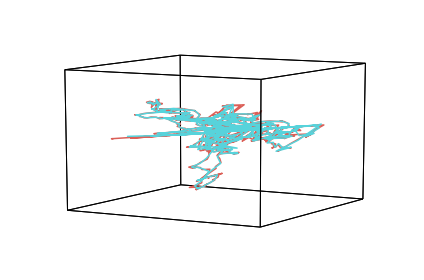

In [203]:
hyp.plot([traj, b])

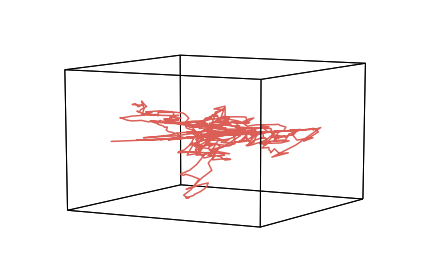

In [200]:
hyp.plot(b)

In [201]:
traj.shape

(1890, 100)

In [202]:
b.shape

(1000, 100)

In [207]:
np.corrcoef(b).shape

(1000, 1000)

In [ ]:
np.save()